At 137 MB (If I recall it was 78.6 MB just two years ago), the CSV for this dataset isn't huge. But with a little work, it's been shrunk down by nearly 90%. If you'd like to know how that was done and how the process was automated, see my github repo. This notebook constains just analysis and display of data. 

## The imports

In [1]:
import pandas as pd

import missingno

import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import plugins
from folium.plugins import HeatMap

## Bring in the data

Because this is the all-in-one and I also use this for testing, I have options for:
 * The local parquet - small, fast and the work is already done
 * Kaggle parquet - same but requires a download

In [2]:
# Try to load the Parquet file from local data directory
try:
    df = pd.read_parquet('../data/denver_accidents.parquet')
    print("Parquet file loaded from local data directory.")
except FileNotFoundError:
    # Try to load the Parquet file from Kaggle input directory
    try:
        df = pd.read_parquet('/kaggle/input/denver-traffic-accidents/denver_accidents.parquet')
        print("Parquet file loaded from Kaggle input directory.")
    except FileNotFoundError:
        # Try to load the CSV file from Kaggle 
        try:
            df = pd.read_csv('/kaggle/input/denver-traffic-accidents/denver_accidents.csv')
            print("CSV file loaded from Kaggle input directory.")
        except FileNotFoundError:
            print("Files not found in either location.")
            df = pd.DataFrame()  # Fallback to an empty DataFrame
            

Parquet file loaded from local data directory.


In [3]:
pd.set_option('future.no_silent_downcasting', True)

In [4]:
df.head(2)

,Incident_Id,Offense_Id,Offense_Code,Offense_Code_Extension,Top_Traffic_Accident_Offense,First_Occurrence_Date,Reported_Date,Incident_Address,Geo_Lon,Geo_Lat,...,Tu2_Vehicle_Movement,Tu2_Driver_Action,Tu2_Driver_Humancontribfactor,Tu2_Pedestrian_Action,Seriously_Injured,Fatalities,Fatality_Mode_1,Fatality_Mode_2,Seriously_Injured_Mode_1,Seriously_Injured_Mode_2
0,2.017536e+09,201753573354410,5441,0,Accident,2017-08-12 17:25:00,2017-08-12 10:43:00,E Colfax Ave / N Grant St,-104.983589,39.740044,...,Other,Other,Other,Other,0.0,0.0,Other,Other,Other,Other
1,2.017187e+09,201718710454410,5441,0,Accident,2017-03-22 00:37:00,2017-03-21 18:12:00,W Evans Ave / S Stuart St,-105.043152,39.679722,...,Stopped In Traffic,Data Misentered,No Apparent,Other,0.0,0.0,Other,Other,Other,Other


# Alright, thumbs up? Ready to wrangle some data? 
## Let's do this. *[Leeroy Jenkins](https://youtu.be/mLyOj_QD4a4?t=83)*

### Let's start off by going though what steps were performed to clean the data
 
 - [x]  Drop useless columns
    ['Object_Id', 'Last_Occurrence_Date', 'Geo_X', 'Geo_Y', 'Point_X', 'Point_Y', 'X', 'Y']
 - [x] Cast columns with `Date` in them as datetimes
 - [x] Missing entries identified
 - [x] Dropped entries with missing Geo_Lon and Geo_Lat coordinates
 - [x] remove prepending `TRAF - ACCIDENT -` from `Top_Traffic_Accident_Offense` column
 - [x] Numeric fields converted NaNs to -1
 - [x] Text or mixed text/numeric field converted NaNs to 'Data not entered'
 - [x] Converted column content text to Title Case

 - [x] Secondary fixes:
   - [x] 'Tu1_Vehicle_Type': '0'
   - [x] 'Tu1_Travel_Direction': ['021', '91']
   - [x] 'Tu1_Vehicle_Movement': ['  ', '18', '021', '00'] # leaving unk as a valid answer
   - [x] 'Tu1_Diver_Action': [' ', '17', na, ]
   - [x] 'Tu1_Driver_Humancontribfactor': [' ',' 00', ' 06', '17', '18']
   - [x] 'Tu1_Pedestrian_Action': ['00', '/', '--', '-']
   - [x] 'Tu2_Vehicle_Type' [' '] 
   - [x] 'Tu1_Travel_Direction': ['  ', '01', '05', '03', '07', '02', '00']
         
##### Considering those were getting labeled as `Data Misentered`, they were lumped together and applied the the Tu1, Tu2, Tu3 columns

### Duplicated options and misentries fixed:
 - [x] `District_Id` and `Top_Traffic_Accident_Offense` whitespace stripped
 - [x] `Light_Condition` replaced 'Day Light' with 'Daylight'

### Data types changed to save memory (cut working memory about half)
When started we were at 78.5 mb. That's still true. While that's quite manageable, let's get that down anyway.

- [x] Covert text_cols to type object datatype except for `Incident_Address` which has too many 


The numerics were different though. The changes break like this:
- [x] Convert Incident_Id, Geo_Lon, Geo_Lat to Int32 
- [x] Offense_Id: Int64
- [x] Convert Offense_Code, Offense_Code_Extension, District_Id, Precinct_Id, Bicycle_Ind, Pedestrian_Ind, Seriously_Injured and Fatalities to object dtype

### And then we saved the file as parquet and lived happily ever after

## Memory use, for reference:

The CSV downloaded is 137.3 mb after the above changes it's down to 14.1 mb, so close to a 90% reduction in file size

Oddly working memory originally used 78.5 mb memory but is down to 20.1 mb, so close to a 75% reduction in memory use.

 - 23.5 mb converting to category.
 - 20.1 making the  `Geo_Lat, Geo_Lon and Incident_Id` all float 32.

That's really about the smallest we can get it. In this case it's not super important but if you had a larger file actions like this can be the difference between one tier of a cloud asset or another.

----

# Part 2: EDA

---
Here are the questions I have so far:
  1. Where are the accidents in general?
  2. Of those locations, where are you most likely to get killed?
  3. Time Analysis
  4. Accidents by Cause
 

## 1. Where are the accidents in general?

In [5]:
df.head()

,Incident_Id,Offense_Id,Offense_Code,Offense_Code_Extension,Top_Traffic_Accident_Offense,First_Occurrence_Date,Reported_Date,Incident_Address,Geo_Lon,Geo_Lat,...,Tu2_Vehicle_Movement,Tu2_Driver_Action,Tu2_Driver_Humancontribfactor,Tu2_Pedestrian_Action,Seriously_Injured,Fatalities,Fatality_Mode_1,Fatality_Mode_2,Seriously_Injured_Mode_1,Seriously_Injured_Mode_2
0,2.017536e+09,201753573354410,5441,0,Accident,2017-08-12 17:25:00,2017-08-12 10:43:00,E Colfax Ave / N Grant St,-104.983589,39.740044,...,Other,Other,Other,Other,0.0,0.0,Other,Other,Other,Other
1,2.017187e+09,201718710454410,5441,0,Accident,2017-03-22 00:37:00,2017-03-21 18:12:00,W Evans Ave / S Stuart St,-105.043152,39.679722,...,Stopped In Traffic,Data Misentered,No Apparent,Other,0.0,0.0,Other,Other,Other,Other
2,2.017459e+09,201745928954410,5441,0,Accident,2017-07-12 16:00:00,2017-07-12 10:26:00,S Sheridan Blvd / W Dartmouth Ave,-105.053215,39.656162,...,Making Left Turn,Data Misentered,No Apparent,Other,0.0,0.0,Other,Other,Other,Other
3,2.017717e+09,201771688954410,5441,0,Accident,2017-10-25 20:21:00,2017-10-25 13:21:00,201 N University Blvd,-104.959770,39.720177,...,Entering/Leaving Parked Position,Data Misentered,No Apparent,Other,0.0,0.0,Other,Other,Other,Other
4,2.017635e+09,201763532954410,5441,0,Accident,2017-09-21 21:51:00,2017-09-21 15:35:00,E Smith Rd / N Holly St,-104.922318,39.774517,...,Going Straight,Data Misentered,No Apparent,Other,0.0,0.0,Other,Other,Other,Other


In [6]:
lat = df.Geo_Lat.mean()
lon =  df.Geo_Lon.mean()

In [7]:
denver_map = folium.Map(location=[lat, lon], tiles="Cartodb Positron", zoom_start=11)

heat_map = folium.FeatureGroup(name = 'heat_map')
heat_map.add_child( HeatMap( list(zip(df['Geo_Lat'].values, df['Geo_Lon'].values)), 
                   min_opacity=0.3,
                   radius=8.5, blur=6, 
                   max_zoom=1, 
                 ))

denver_map.add_child(heat_map)
denver_map

### Visually, it looks like the most accidents occur on the highways. Let's confirm and get details.

## 2. Of those locations, where are you most likely to get killed?

#### I don't know about you but I don't want to die, I have too much to live for. We're supposedly living in the Golden Age of television and I still have to catch up on [Bass Masters. It's a fishing show](https://www.youtube.com/watch?v=zXooaIxmpB8&ab_channel=Ghostbusters.net).

In [8]:
accident_prone = df.groupby(['Incident_Address', 'Geo_Lon', 'Geo_Lat']).size().reset_index(name='count').sort_values('count', ascending=False)

In [9]:
# Ensure Fatalities column is numeric
df['Fatalities'] = pd.to_numeric(df['Fatalities'], errors='coerce')

# Create the accident_and_death_prone DataFrame with the sum of Fatalities and count of Incidents
accident_and_death_prone = df.groupby(['Incident_Address', 'Geo_Lon', 'Geo_Lat']) \
                             .agg(Total_Fatalities=('Fatalities', 'sum'),
                                  Total_Accidents=('Incident_Address', 'size')) \
                             .sort_values('Total_Accidents', ascending=False) \
                             .reset_index()

# Display the result
accident_and_death_prone.head()



,Incident_Address,Geo_Lon,Geo_Lat,Total_Fatalities,Total_Accidents
0,I25 Hwynb / W 6Th Ave,-105.013229,39.725677,-6.0,1520
1,I70 Hwyeb / N Peoria St,-104.847038,39.774006,-2.0,1021
2,I25 Hwynb / W Alameda Ave,-104.998901,39.711205,-1.0,923
3,I25 Hwysb / 20Th St,-105.004768,39.761158,-1.0,813
4,I25 Hwynb / 20Th St,-105.004333,39.760948,1.0,791


In [10]:
# Create a dataframe with the sum of Fatalities
fatalities_sum = df.groupby(['Incident_Address', 'Geo_Lon', 'Geo_Lat']).agg({'Fatalities': 'sum'})\
    .rename(columns={'Fatalities': 'Total_Fatalities'})

# Create a dataframe with the count of Incident_Address
address_count = df['Incident_Address'].value_counts().reset_index()
address_count.columns = ['Incident_Address', 'Total_Accidents']

# Merge the two dataframes on Incident_Address
accident_and_death_prone = fatalities_sum.reset_index().merge(address_count, on='Incident_Address')

# Sort the dataframe by Total_Accidents in descending order
accident_and_death_prone = accident_and_death_prone.sort_values('Total_Accidents', ascending=False)


In [11]:
# add 0.1 to the 'Total_Fatalities' column
accident_and_death_prone['P&C loss index'] = (accident_and_death_prone['Total_Fatalities']+.1)*accident_and_death_prone['Total_Accidents']

# reorder the dataframe by the product of 'Total_Fatalities' and 'Total_Accidents'
accident_and_death_prone = accident_and_death_prone.sort_values('P&C loss index', ascending=False)
accident_and_death_prone.head(25)

,Incident_Address,Geo_Lon,Geo_Lat,Total_Fatalities,Total_Accidents,P&C loss index
36309,I70 Hwyeb / N Havana St,-104.865891,39.775635,2.0,952,1999.2
35943,I25 Hwynb / W 6Th Ave,-105.013130,39.725536,1.0,1736,1909.6
35959,I25 Hwynb / W Colfax Ave,-105.013969,39.740437,2.0,638,1339.8
36324,I70 Hwyeb / N Pecos St,-105.006424,39.783138,2.0,522,1096.2
45303,W 6Th Ave / I25 Hwynb,-105.013130,39.725536,3.0,326,1010.6
35821,I25 Hwynb / 20Th St,-105.004333,39.760948,1.0,791,870.1
36278,I70 Hwyeb / I25 Hwysb,-104.989555,39.780109,2.0,375,787.5
36120,I25 Hwysb / W 8Th Ave,-105.015053,39.729321,2.0,331,695.1
36321,I70 Hwyeb / N Northfield Quebec St,-104.903435,39.778301,1.0,589,647.9
36294,I70 Hwyeb / N Central Park Blvd,-104.882790,39.777119,1.0,559,614.9


In [12]:
count = round(100/len(set(df['Incident_Address'])), 4)
percent = round(accident_and_death_prone['Total_Accidents'].head(25).sum()*100/accident_and_death_prone['Total_Accidents'].sum(), 4)

print(f"The 25 locations where one is most likely to get into an accident account for {count} percent of the locations but {percent} percent to the accidents.")

The 25 locations where one is most likely to get into an accident account for 0.0023 percent of the locations but 3.7973 percent to the accidents.


In [13]:
accident_and_death_prone['Total_Accidents'].head(25).sum()/accident_and_death_prone['Total_Accidents'].sum()

np.float64(0.03797298082243711)

### The top 25 locations (or about .05% of the locations) make up about 4.5% of the accidents. But, realistically, it's less than that due to the way data was entered. 

 - 20Th St / I25 Hwynb vs I25 Hwysb / 20Th St
 - W 6Th Ave / I25 Hwynb vs I25 Hwynb / W 6Th Ave
 - I25 Hwynb / W 8Th Ave vs I25 Hwysb / W 8Th Ave
 - I70 Hwyeb / N Havana St vs I70 Hwyeb / N Havana St
 - I25 Hwynb / I70 Hwyeb vs 70 Hwyeb / I25 Hwysb

#### While I'm not going to address this (this is, afterall, just preliminary EDA model to entice *you* to use the dataset) we could deconflict this with `Geo_Lat` and `Geo_Lon` location columns.

## 3. Time Analysis

#### or "Damn! Covid had an impact! I wish we'd have another world wide pandemic" 

In [34]:
def lineplots(df, key='First_Occurrence_Date', freq='M',
              xtitle="Denver Accidents by Month", ytitle='# of Collisions'):
    
    fig, ax = plt.subplots(1,1)
    plt.style.use('fivethirtyeight')
    fig.set_size_inches(10, 4)

    # Group by the specified frequency and filter out incomplete periods
    grouped = df.groupby(pd.Grouper(key=key, freq=freq)).size()
    # Filter out the last period if it's incomplete
    if grouped.index[-1] > df[key].max():
        grouped = grouped.iloc[:-1]

    ax.plot(grouped, '.', linestyle=(0, (1, 1)), color='blue', linewidth=1)

    ax.set_title(xtitle)
    ax.set_ylabel(ytitle)
    return ax

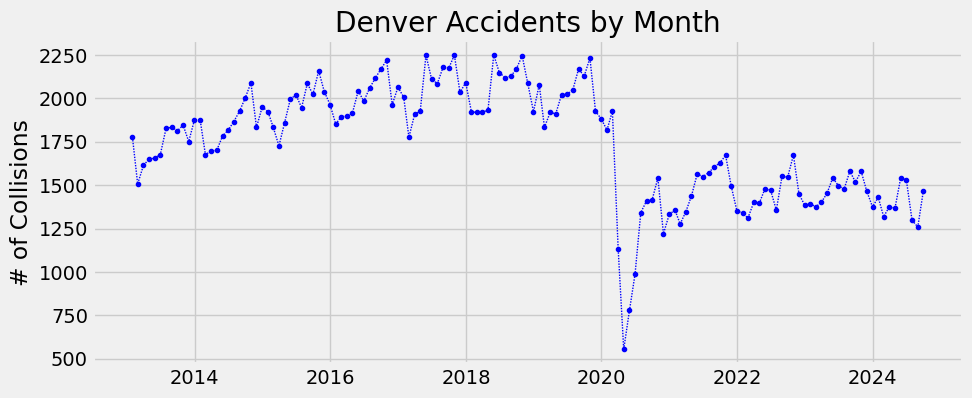

In [36]:
lineplots(df, key='First_Occurrence_Date', freq='ME',
          xtitle="Denver Accidents by Month", ytitle='# of Collisions');

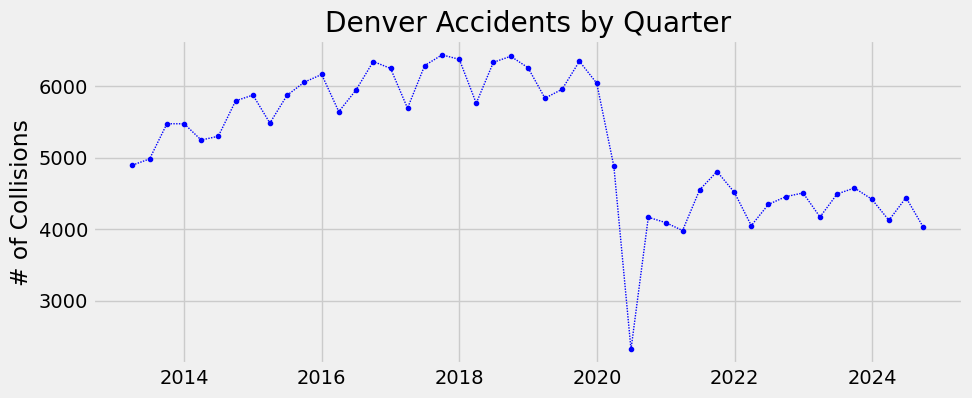

In [37]:
lineplots(df, key='First_Occurrence_Date', freq='QE',
          xtitle="Denver Accidents by Quarter", ytitle='# of Collisions');

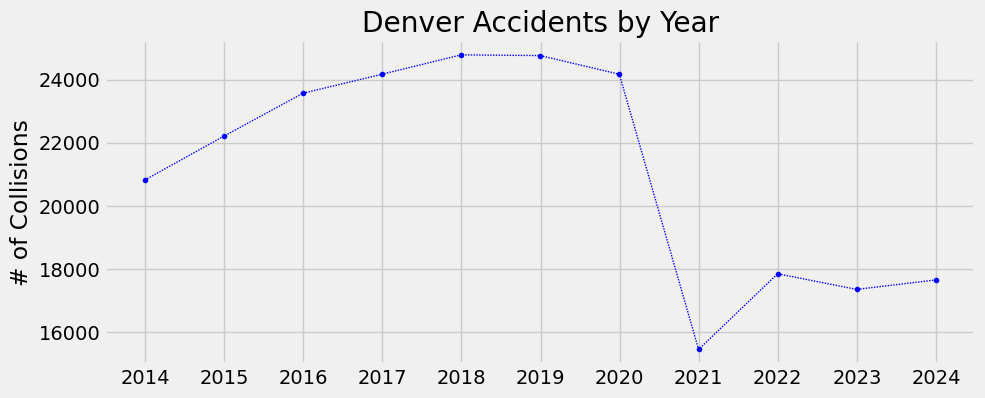

In [38]:
lineplots(df, key='First_Occurrence_Date', freq='YE',
           xtitle="Denver Accidents by Year", ytitle='# of Collisions');

## 4. Accidents by Cause

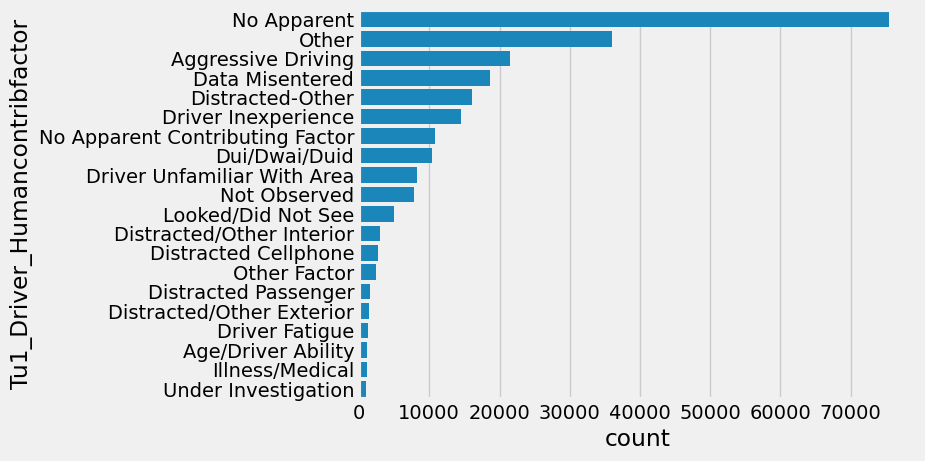

In [18]:
order = df["Tu1_Driver_Humancontribfactor"].value_counts().index.tolist()
sns.countplot(y=df["Tu1_Driver_Humancontribfactor"], order=order[:20]);

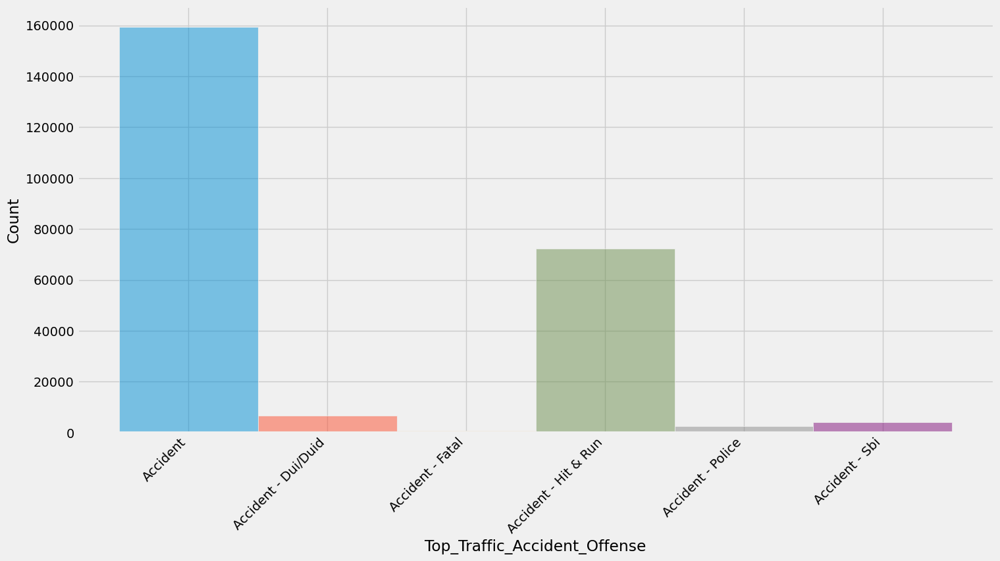

In [19]:
chart = plt.figure(figsize=(16,8))
sns.histplot(df, x="Top_Traffic_Accident_Offense", hue="Top_Traffic_Accident_Offense", legend=False)
plt.xticks(rotation=45, ha='right');

## Cited Cause Analysis over the time of day

### Here is what I think are the take home messages:
 - `DUI/DWAI/DUID` have to big bumps the first is early morning and peaks around 2am it then pick up after 4pm and peaks again between 8 and 10 pm.
 
 - `Driver Fatigue` is very evenly spread
 
 - Similarly, `Asleep At The Wheel` is more of an early morning thing
 
 - You're more likely to end up in an accident with a person who has a physical diasbility in the middle of the day.


/var/folders/_3/9_qsgmm55yg0k3k8tgh0gy3w0000gn/T/ipykernel_27693/2198169659.py:10: UserWarning: 
The palette list has fewer values (8) than needed (36) and will cycle, which may produce an uninterpretable plot.
  ax = sns.violinplot(data=df, x='Hour', y="Tu1_Driver_Humancontribfactor", hue="Tu1_Driver_Humancontribfactor", order=relevant_order, palette=custom_palette, legend=False)


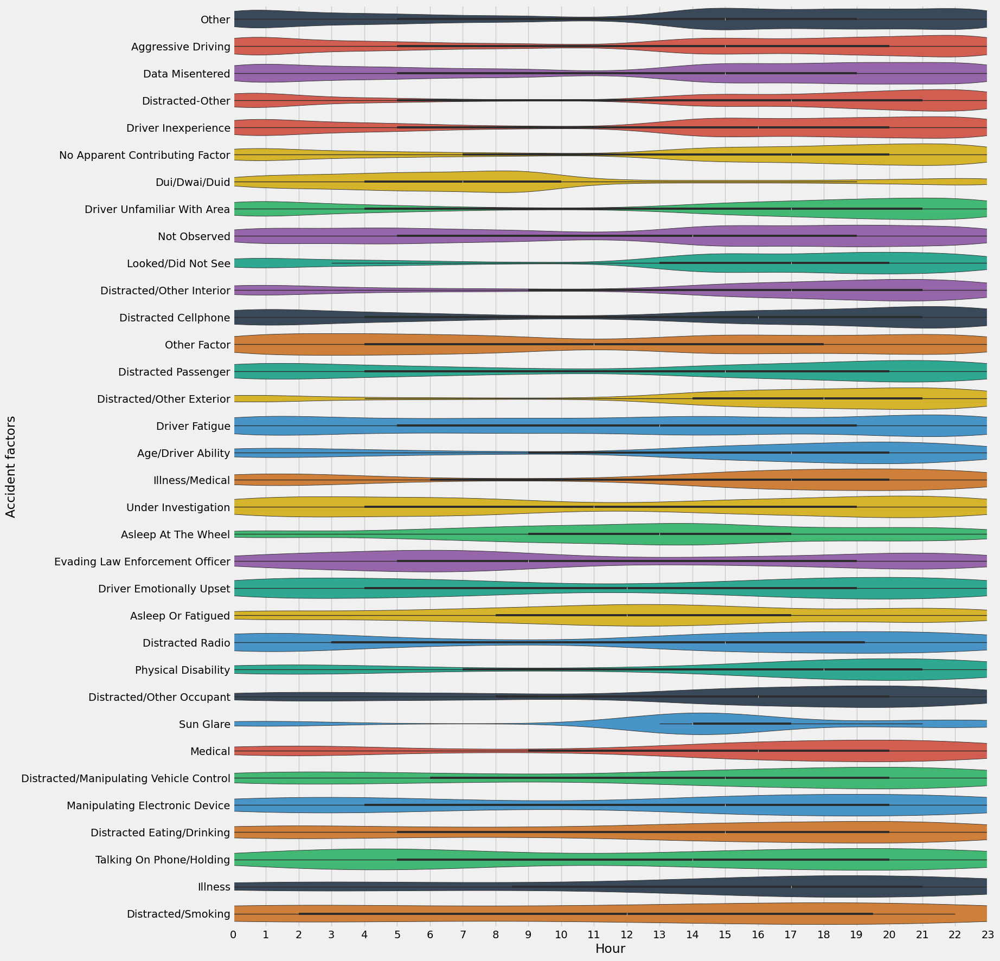

In [20]:

# Extract the hour and create a new column
df['Hour'] = df['First_Occurrence_Date'].dt.hour

custom_palette = ["#3498db", "#e74c3c", "#2ecc71", "#f1c40f", "#9b59b6", "#34495e", "#e67e22", "#1abc9c"]
order = df["Tu1_Driver_Humancontribfactor"].value_counts().index.tolist()
relevant_order = order[1:-1]
chart = plt.figure(figsize=(16,21))

# Assigning the y variable to hue and setting legend to False
ax = sns.violinplot(data=df, x='Hour', y="Tu1_Driver_Humancontribfactor", hue="Tu1_Driver_Humancontribfactor", order=relevant_order, palette=custom_palette, legend=False)

ax.set_ylabel('Accident factors')
ax.set_xlim(0, 23)
ax.set_xticks(range(0, 24))
ax.set_xticklabels(range(0, 24))

plt.show()

## Accidents by Day of The Month

The first thing you'll notice is the end the month has fewer accidents. Let's meditate a moment on that.

Text(0, 0.5, 'Accident Count (total)')

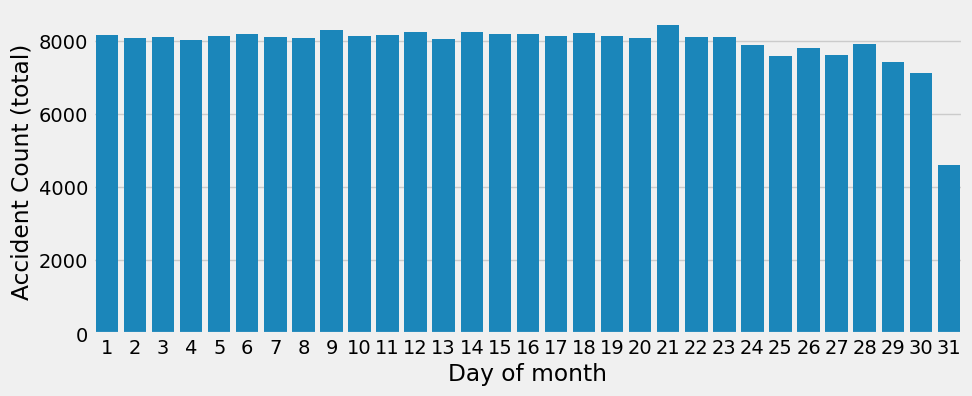

In [21]:
chart = plt.figure(figsize=(10,4))
sns.countplot(data=df, x=df['First_Occurrence_Date'].dt.day)
plt.xlabel('Day of month')
plt.ylabel('Accident Count (total)')

The answer is pretty obivious in that there are less days. The count is lower because there are less days to have the accidents and therefore the citation.

Now, what accounts for 22-28 dip?

That's a damn good question!

Text(0, 0.5, 'Accident Count')

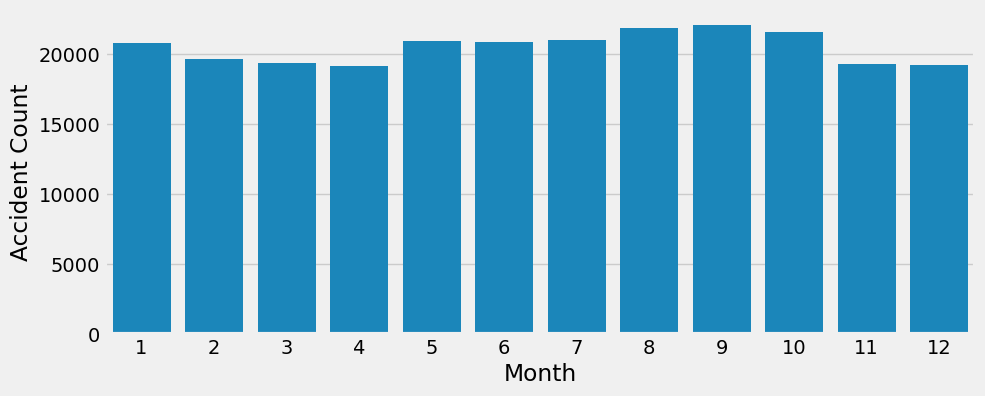

In [22]:
chart = plt.figure(figsize=(10,4))
sns.countplot(data=df, x=df['First_Occurrence_Date'].dt.month)
plt.xlabel('Month')
plt.ylabel('Accident Count')

## Ending 

Alright, that's it for now. Hopefully, you found this interesting (and enjoyed the link) and have a few questions of your own.

If not, here are few areas:

 - Accidents that involve pedestrians
 - Accidents that involve bike riders.
 - Look into the seasonality
 - Combine the distracted categories (cell 19)
 - Reanalyse with combined locations (cells 10-12)